# Keyword Extraction of Wikipedia Articles Test
Wikipedia is an encyclopedia that covers a large amount of diverse topics. All articles are created, corrected and updated by individuals. The goal is to correctly document as many topics as possible by collecting the knowledge of a large number of people. However, some articles stand out due to their completeness, scope and presentation, and for this they are marked with the distinction of the Excellent Article. 

As part of the Natural Language Processing lecture, a classification of Wikipedia articles is to be carried out as a sub-task of an assignment with the goal of being able to identify excellent articles. This notebook contains the code to accomplish this goal and is structured as follows:

- [1. Imports](article_classification.ipynb#1-imports)
- [2. Automated Data Check](article_classification.ipynb#2-check-data-availability)
- [3. Load and Process the Data](article_classification.ipynb#3-data-processing)
- [4. Train Neural Network]()
	- [4.1 Train/Validation/Test-Split](#thema1)
	- [4.2 Pre-Process the Texts](#thema2)
	- [4.3 Create Neural Network](#thema3)
	- [4.4 Train the Neural Network]()
	- [4.5 Validation of Results]()
- [5. Conclusion](#schluss)

## 1. Imports
Import the requiered libraties into the notebook.
If some libraries are not installed, you can use the `requierements.txt` and run
```
$ pip install -r requirements.txt
```
in the terminal.

In [1]:
# Automated Data Download & Extraction
import os
import subprocess

# Effecient Processing of Wikipedia Dump
import mwxml # Import mwxml for effecient iteration of dump
import mwparserfromhell # Extract Features from Text

# Data Storage
import re # Import RegEx
from tqdm import tqdm # Import Progress-Bar
import pandas as pd
import numpy as np

# Pre-Processing
import spacy
from tqdm import tqdm
from nltk.tokenize import RegexpTokenizer
import treetaggerwrapper
from spacy.lang.de.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer


# Keyword Extraction Methods
import yake
from keybert import KeyBERT
import time

# Evaluation
from sentence_transformers import SentenceTransformer, util
import matplotlib.pyplot as plt

/usr/local/Caskroom/miniconda/base/envs/nlp/lib/python3.8/site-packages/treetaggerwrapper.py:739: FutureWarning: Possible nested set at position 8
  punct2find_re = re.compile("([^ ])([[" + ALONEMARKS + "])",
/usr/local/Caskroom/miniconda/base/envs/nlp/lib/python3.8/site-packages/treetaggerwrapper.py:2043: FutureWarning: Possible nested set at position 152
  DnsHostMatch_re = re.compile("(" + DnsHost_expression + ")",
/usr/local/Caskroom/miniconda/base/envs/nlp/lib/python3.8/site-packages/treetaggerwrapper.py:2067: FutureWarning: Possible nested set at position 409
  UrlMatch_re = re.compile(UrlMatch_expression, re.VERBOSE | re.IGNORECASE)
/usr/local/Caskroom/miniconda/base/envs/nlp/lib/python3.8/site-packages/treetaggerwrapper.py:2079: FutureWarning: Possible nested set at position 192
  EmailMatch_re = re.compile(EmailMatch_expression, re.VERBOSE | re.IGNORECASE)
/usr/local/Caskroom/miniconda/base/envs/nlp/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found.

## 2. Check Data Availability
In order to get the training data, a backup of the current wikipedia encyclopedie is needed. <br>
These dumps can be downloaded in every language by changing the url to https://dumps.wikimedia.org/[`insert_language (e.g. de, en)`]wiki/latest/. <br>
To make this example easy to run and have an equal data foundation, the download was automated with this cell. If the correct file already exists in the data folder, the download will be skipped. <br>
The file will be donwloaded as an `.bz2`-Archive and must be extracted before use. <br>
<b>Note: Due to the size of the file, the download may take a longer time depending on your internet connection.</b>

In [2]:
if(not(os.path.exists("../Data"))):
   os.makedirs('../Data')

if(not(os.path.exists("../Data/dewiki-latest-pages-articles-multistream.xml"))):
    print("Articles-File not found. Download started... (this might take a while):")
    subprocess.call(['sh', '../bin/download-and-unzip-data.sh'])
print("Articles-File available at: ../Data/dewiki-latest-pages-articles-multistream.xml")

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.Articles-File available at: ../Data/dewiki-latest-pages-articles-multistream.xml



## 3. Data Processing
A big challenge is the effecient processing of the wikipedia dump files. Due to its size (ca. 26,8 GB), it is not possible to load the whole file into the memory. There are different approaches to deal with this problem but we chose to use the `mwxml`-library, which creates an generator-object that returns a single Wikipedia article at a time. In order to use natural language processing for the classification of the individual articles, the respecitve texts must be extracted. However, this poses another challenge due to the HTML-formatting.

In [3]:
def extract_excellent_articles_to_dataframe(path_to_dump:str) -> pd.DataFrame:
    """
    Creates a dataset out of a wikipedia dump that contains only excellent articles.


    Parameters
    ----------
    path_to_dump : str. Relative file path to the unzipped wikipedia dump

    Returns
    -------
    df: pd.DataFrame. Pandas DataFrame that contains the processed wikipedia articles
    """
    data_index = [] # Empty array for the article ids
    label_index = [] # Empty array for the labels
    dump = mwxml.Dump.from_file(open(path_to_dump)) # Load Wikipedia dump and create generator object
    i = 0 # Set iteration variable to zero
    print("Step 1: Search Wikipedia Dataset")
    pbar = tqdm(total=5425758) # Create statusbar
    for page in dump: # Iterate over pages in dump
        for revisions in page: # Iterate over revisions of page
            try:
                if("Liste von Autoren" not in revisions.page.title): # Exclude non-article revisions
                    if(re.search(r"{{Exzellent[|](\d*).(\D*)(\d*)[|](\d*)}}", revisions.text)): # If article is marked as excelennt
                        label_index.append(1) # Add 1 (positive) as label to array
                    else:
                        label_index.append(0) # Add 0 (negative) as label to array
                    data_index.append(revisions.page.id) # Add page id to array
                    i += 1 # Increment iteration variable
                    pbar.update(1) # Updata status bar
            except Exception as e:
                print(e)
    pbar.close() # Stop progress bar
    print("Step 2: Resample Collected Data")
    temp_df = pd.DataFrame({'text_id': data_index, 'label': label_index}, columns=['text_id', 'label']) #  Create temporal dataframe
    valid_list = temp_df[temp_df['label'] == 1].values # Create list with valid article ids
    print("Step 3: Create Balanced Dataset")
    text = np.memmap('../Data/article_text.dat', dtype='object', mode='w+', shape=(len(valid_list), 1)) # Create memmap for texts
    dump = mwxml.Dump.from_file(open(path_to_dump)) # Load Wikipedia dump and create generator object
    i = 0 # Reset iteration variable to zero
    pbar2 = tqdm(total=len(valid_list)) # Create statusbar
    for page in dump: # Iterate over pages in dump
        for revisions in page: # Iterate over revisions in page
            try:
                if("Liste von Autoren" not in revisions.page.title): # Exclude non-article revisions
                    if revisions.page.id in valid_list: # If article is in resampled scope
                        temp_text = mwparserfromhell.parse(revisions.text) # Parse text
                        if any((re.match(r"{{Exzellent[|](\d*).(\D*)(\d*)[|](\d*)}}", str(template)) for template in temp_text.filter_templates())): # If article is markes as excellent
                            text[i] = re.sub(r"Exzellent (\d*).(\D*).(\d*)", "", (" ".join((" ".join(list(map(str, temp_text.filter_text())))).split()))) # Add cleaned text to memmap
                        i += 1 # Increment iteration variable
                        pbar2.update(1) # Update status bar
            except Exception as e:
                print(e)
        if(i>=len(valid_list)): # If valid list is completed
            break # Break iteration
    pbar2.close() # Close status bar
    return np.array(text).ravel() 

In [4]:
url_to_dump = "../Data/dewiki-latest-pages-articles-multistream.xml"

if os.path.exists(url_to_dump):
    dataframe = pd.read_pickle("../Data/processed_excellet_articels.pkl")
    print("Data has already been extracted and will be loded from storage")
else:
    # Extract excelent atricels from wikipedia dump
    dataframe = extract_excellent_articles_to_dataframe(path_to_dump=url_to_dump)

    # Pickel dataframe to avoid running the processing function every time
    df = pd.DataFrame(dataframe , columns = ['text'])
    df.to_pickle("../Data/processed_excellet_articels.pkl")

Data has already been extracted and will be loded from storage


In [5]:
# Select number of samples to train models
num_sampels = 100

docs_raw = dataframe.copy()
docs_raw = docs_raw.sample(n=num_sampels).reset_index(drop=True)
docs_raw = docs_raw['text']

docs = docs_raw.tolist().copy()
docs

["Begriffsklärungshinweis Datei:Prometheus and Atlas, Laconian black-figure kylix, by the Arkesilas Painter, 560-550 BC, inv. 16592 - Museo Gregoriano Etrusco - Vatican Museums - DSC01069.jpg mini|Der gefesselte Prometheus mit dem Adler; links sein Bruder Atlas (Mythologie) Atlas ( Lakonische Vasenmalerei Lakonisch- Schwarzfigurige Vasenmalerei schwarzfigurige Kylix (Gefäß) Trinkschale des Arkesilas-Maler s aus Cerveteri , um 560/550 v. Chr., Vatikanische Museen , Museo Gregoriano Etrusco 16592) Prometheus ( grcS Προμηθεύς Promētheús de der Vorausdenkende‘, ‚der Vorbedenker ; Betonung latein isch und deutsch Prométheus, [ IPA pʁoˈmeːtɔɪ̯s ] Audio De-Prometheus.ogg ) ist eine Gestalt der Griechische Mythologie griechischen Mythologie . Die Prometheussage gehört zu den bekanntesten literarischen Stoffen. Prometheus gehört dem Göttergeschlecht der Titan (Mythologie) Titanen an. Wie alle Wesen ist er der Herrschaft des Göttervaters Zeus unterworfen. Bei einem Tieropfer greift er zu einer L

# Preprocessing

## Tokenizer

Der RegexpTokenizer teilt den Text eines Dokumentes in einzelne Wörter (Tokens) auf. Satzzeichen und Zahlen werden ebenfalls zu Tokens. Satzzeichen werden entfernt indem alle Tokens die nur ein Zeichen habe entfernt werden. Tokens die Zahlen enthalten werden ebenfalls entfernt.

In [6]:
# Tokenize the documents

tokenizer = RegexpTokenizer(r'\w+')
for idx in range(len(docs)):
    docs[idx] = docs[idx].lower()  # To lowercase 
    docs[idx] = tokenizer.tokenize(docs[idx])  # Split into words

# Remove numbers unnecessary words or signs

docs = [[token for token in doc if not token.isnumeric()] for doc in docs] # Remove numbers

docs = [[token for token in doc if len(token) > 1] for doc in docs] # Remove tokens with one character

docs

[['begriffsklärungshinweis',
  'datei',
  'prometheus',
  'and',
  'atlas',
  'laconian',
  'black',
  'figure',
  'kylix',
  'by',
  'the',
  'arkesilas',
  'painter',
  'bc',
  'inv',
  'museo',
  'gregoriano',
  'etrusco',
  'vatican',
  'museums',
  'dsc01069',
  'jpg',
  'mini',
  'der',
  'gefesselte',
  'prometheus',
  'mit',
  'dem',
  'adler',
  'links',
  'sein',
  'bruder',
  'atlas',
  'mythologie',
  'atlas',
  'lakonische',
  'vasenmalerei',
  'lakonisch',
  'schwarzfigurige',
  'vasenmalerei',
  'schwarzfigurige',
  'kylix',
  'gefäß',
  'trinkschale',
  'des',
  'arkesilas',
  'maler',
  'aus',
  'cerveteri',
  'um',
  'chr',
  'vatikanische',
  'museen',
  'museo',
  'gregoriano',
  'etrusco',
  'prometheus',
  'grcs',
  'προμηθεύς',
  'promētheús',
  'de',
  'der',
  'vorausdenkende',
  'der',
  'vorbedenker',
  'betonung',
  'latein',
  'isch',
  'und',
  'deutsch',
  'prométheus',
  'ipa',
  'pʁoˈmeːtɔɪ',
  'audio',
  'de',
  'prometheus',
  'ogg',
  'ist',
  'eine'

## Lemmatizizer

While a stemmer reduces words to their stem by removing the endings, a lemmatizer is used to bring words into their actual base form. While the stemmer is easier and faster, in this case the words should still form a grammatically sound word that can be used as a keyword. Expert and expert should not become expert (stemmer) but expert (lemmatizer). The lemmatizer in the following is selected according to its speed as well as its performance. Therefore the spacy, treetagger and hannover lemmatizers are compared.

In [7]:
# Lemmatize tokens 

lemmatizer = treetaggerwrapper.TreeTagger(TAGLANG='de', TAGDIR="/Users/leamayer/Downloads/tree-tagger-MacOSX-M1-3.2.3")

# wie sollen die Profs diesem Download machen ?

docs = [[treetaggerwrapper.make_tags(lemmatizer.tag_text(token))[0].lemma for token in doc] for doc in tqdm(docs) ]
# 04m 23s for 100 docs
docs

 32%|███▏      | 32/100 [01:49<03:14,  2.86s/it]

In [ ]:
# to slow

'''# Lemmatize tokens

lemmatizer = spacy.load('de_core_news_sm')
test  = [[lemmatizer(token) for token in doc] for doc in tqdm(docs) ]
# 44m 48s for 100 docs

test '''

"# Lemmatize tokens\n\nlemmatizer = spacy.load('de_core_news_sm')\ntest  = [[lemmatizer(token) for token in doc] for doc in tqdm(docs) ]\n# 44m 48s for 100 docs\n\ntest "

## Remove Stopwords
Stop words are common words that are often removed during text preprocessing because they have little semantic meaning. To remove stop words, one must determine what stop words are. There are several libraries that contain lists of stop words in different languages. However, there are certain words in Wikipedia articles that occur frequently and are not yet included in these lists. For example, words like "reference", etc. In the following, a technique is presented to find these specific stop words. Then, these stop words are added to the list of spacy stop words.

### Get document speficiy Stopwords

The TF-IDF (term frequency–inverse document frequency) scores are calculated using the TfidfVectorizer class from scikit-learn. The process involves counting term frequencies (TF), measuring the rarity of terms across the document collection (IDF), and computing the TF-IDF score by multiplying TF with IDF. The top N words with the highest TF-IDF scores can be selected as potential stopwords.

In [ ]:
# Select the top N words with the highest TF-IDF scores as potential stopwords

vectorizer = TfidfVectorizer() # TfidfVectorizer object from sklearn

tfidf_matrix = vectorizer.fit_transform(docs_raw) # Fit the vectorizer to the documents

feature_names = vectorizer.get_feature_names_out() # Get the names of the tokens

avg_tfidf_scores = tfidf_matrix.mean(axis=0).tolist()[0] # Get average TF-IDF score for each word across all documents

word_scores = list(zip(feature_names, avg_tfidf_scores)) # Create a list of words and their TF-IDF scores

word_scores.sort(key=lambda x: x[1], reverse=True) # Sort the word_scores in descending order

N = 300  # Number of stopwords to select
stopwords = [word for word, score in word_scores[:N]] # Potential stopwords

stopwords

['der',
 'die',
 'und',
 'in',
 'ref',
 'von',
 'den',
 'des',
 'im',
 'das',
 'mit',
 'zu',
 'auf',
 'als',
 'dem',
 'eine',
 'sich',
 'für',
 'ist',
 'name',
 'ein',
 'auch',
 'the',
 'an',
 'wurde',
 'aus',
 'nach',
 'bei',
 'war',
 'of',
 'am',
 'er',
 'de',
 'nicht',
 'sie',
 'bis',
 'durch',
 'einer',
 'es',
 'werden',
 'zur',
 'zum',
 'sind',
 'dass',
 'datei',
 'berlin',
 'um',
 'über',
 'oder',
 'align',
 'www',
 'http',
 'jpg',
 'einem',
 'wie',
 'wurden',
 'style',
 'titel',
 'wird',
 'isbn',
 'vor',
 'einen',
 'memmingen',
 'mini',
 'and',
 'nur',
 'vom',
 'datum',
 'unter',
 'orgel',
 'text',
 'autor',
 'so',
 'diese',
 'arten',
 'noch',
 'film',
 'url',
 'linde',
 'hrsg',
 'aber',
 'stadt',
 'waren',
 '10',
 'dieser',
 'hatte',
 'platon',
 'https',
 'math',
 'kirche',
 'literatur',
 'zwischen',
 'right',
 'seine',
 'heine',
 'sup',
 'verlag',
 'arbon',
 'seiner',
 'aarau',
 'zappa',
 'st',
 'calder',
 'erkrath',
 'band',
 'indium',
 'sowie',
 'hier',
 'br',
 'dowding',
 '

### Create final Stopword List

With the help of the spacy STOP_WORDS list all words with little semantic meaning are selected. Since the wikipediatext contains other words that are used to format the text (e.g. ref), the previously identified stopwords are added to the list.

In [ ]:
# Add potential stopwords to existing spacy stopwords list

original_stopword_len = len(STOP_WORDS)

stop_words = STOP_WORDS.copy()

stop_words |= set(stopwords) # Add the additional wikipedia specific stopwords

merged_stopword_len = len(stop_words)

print(f"{merged_stopword_len-original_stopword_len} document specific stopwords have been added to the spacy stopwords list")

stop_words

193 document specific stopwords have been added to the spacy stopwords list


{'000',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '19',
 '1944',
 '20',
 '2007',
 '2008',
 '2010',
 '2011',
 '978',
 'a',
 'aarau',
 'ab',
 'aber',
 'abruf',
 'ach',
 'acht',
 'achte',
 'achten',
 'achter',
 'achtes',
 'aedes',
 'ag',
 'align',
 'alle',
 'allein',
 'allem',
 'allen',
 'aller',
 'allerdings',
 'alles',
 'allgemeinen',
 'als',
 'also',
 'am',
 'an',
 'and',
 'andere',
 'anderem',
 'anderen',
 'andern',
 'anders',
 'arbon',
 'arnolf',
 'art',
 'arten',
 'auch',
 'auf',
 'auflage',
 'august',
 'aus',
 'ausser',
 'ausserdem',
 'autor',
 'außer',
 'außerdem',
 'background',
 'bahn',
 'bahnhof',
 'bald',
 'band',
 'bd',
 'beato',
 'beckett',
 'bei',
 'beide',
 'beiden',
 'beim',
 'beispiel',
 'bekannt',
 'benjamin',
 'bereits',
 'berlin',
 'berliner',
 'besonders',
 'besser',
 'besten',
 'bin',
 'bis',
 'bisher',
 'bist',
 'blade',
 'border',
 'br',
 'buchmalerei',
 'calder',
 'center',
 'chr',
 'colonna',
 'color',
 'com',
 'corinth',
 'da',
 'dabei',
 'dadurch',
 'd

### Remove Stopwords

Use stopword list to remove stopwords from toenized text.

In [ ]:
# Remove stopwords
len(docs)

docs = [[token for token in doc if token not in stop_words] for doc in docs]

docs

[['Artikel',
  'behandeln',
  'ausscheidungsprodukt',
  'zu+die',
  'Opernintendant',
  'Wladimir',
  'georgijewitsch',
  'Urin',
  'zu+die',
  'italienisch',
  'Gemeinde',
  'orino',
  'Datei',
  'Harntrakt',
  'png',
  'Harnweg',
  'manne',
  'Urin',
  'lesen',
  'urina',
  'altgriechisch',
  'οὖρον',
  'oúron',
  'harn',
  'nennen',
  'Flüssigkeit',
  'flüssig',
  'Paste',
  'pastöses',
  'Ausscheidung',
  'nowiki',
  'Produkt',
  'Wirbeltier',
  'Literatur',
  'Autor',
  'Eckart',
  'klein',
  'Titel',
  'bilingual',
  'Wörterbuch',
  'Biologie',
  'Verlag',
  'verbinden',
  'deutsch',
  'biologen',
  'München',
  'Datum',
  'entstehen',
  'Niere',
  'ableitend',
  'Harnweg',
  'ableitend',
  'Harnweg',
  'außen',
  'geleiten|leiten',
  'Ausscheidung',
  'urins',
  'dienen',
  'Regulation',
  'wassern',
  'elektrolyt',
  'Haushalt',
  'flüssigkeits',
  'elektrolythaushalt',
  'Beseitigung',
  'Stoffwechsel',
  'nowiki',
  'Abbauprodukt',
  'metabolit',
  'insbesondere',
  'bei+die'

# Keyword Extraction

In [ ]:
# prepare result dataframe

df_results = pd.DataFrame()

df_results ["text"] = docs_raw.reset_index(drop=True)

df_results = df_results

df_results

,text
0,Dieser Artikel behandelt das Ausscheidungsprod...
1,Datei:Gorey28.jpg mini|hochkant=1.4|Edward Gor...
2,Infobox Nationalpark title Poverty Point State...
3,Infobox Film Bild Deutscher Titel Originaltite...
4,Infobox Nationalpark title Ku-ring-gai-Chase-N...
...,...
95,Datei:Essen 2011 66-2.jpg mini|hochkant=1.5|Da...
96,Datei:Erna Wazinski ArM.jpg mini|Erna Wazinski...
97,Datei:MMW 10B23 002R MINMJean de Vaudetar.jpg ...
98,Die feline Hyperthyreose ist eine Störung des ...


## Latent Dirichlet Allocation (LDA) for Topic Modelling

https://radimrehurek.com/gensim/auto_examples/tutorials/run_lda.html

In [ ]:
# Compute bigrams
from gensim.models import Phrases

# Add bigrams and trigrams to docs (only ones that appear 20 times or more)

bigram = Phrases(docs, min_count=20)
for idx in range(len(docs)):
    for token in bigram[docs[idx]]:
        if '_' in token:
            # Token is a bigram, add to document
            docs[idx].append(token)

# Remove rare and common tokens

from gensim.corpora import Dictionary

# Create a dictionary representation of the documents

dictionary = Dictionary(docs)

# Filter out words that occur less than 20 documents, or more than 50% of the documents

dictionary.filter_extremes(no_below=20, no_above=0.5)

# Bag-of-words representation of the documents

corpus = [dictionary.doc2bow(doc) for doc in docs]

print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 1313
Number of documents: 100


In [ ]:
from gensim.models import LdaModel

# Set training parameters
num_topics = 10
chunksize = 2000
passes = 20
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make an index to word dictionary
temp = dictionary[0] 
id2word = dictionary.id2token

model = LdaModel(
    corpus=corpus,
    id2word=id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)

In [ ]:
keywords_list = []

for i in range (0, len(corpus)):
    topic_distribution = model.get_document_topics(corpus[i])
    # Sort the topics by their probability in descending order
    sorted_topics = sorted(topic_distribution, key=lambda x: x[1], reverse=True)
    # Get the top N keywords for the highest-probability topic
    top_keywords = model.show_topic(sorted_topics[0][0], topn=3)
    # Extract and return the keyword strings
    keywords = [keyword for keyword, _ in top_keywords]
    keywords_list.append(keywords)

print(keywords_list)

[['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['vgl', 'philosophie', 'roman'], ['staaten', 'vereinigten', 'kunst'], ['vgl', 'philosophie', 'roman'], ['nummer', 'chemie', 'journal'], ['olympische', 'bgcolor', 'sommerspiele'], ['olympische', 'bgcolor', 'sommerspiele'], ['musik', 'album', 'star'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['leipzig', 'gemeinde', 'gebäude'], ['leipzig', 'gemeinde', 'gebäude'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['olympische', 'bgcolor', 'sommerspiele'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['nummer', 'chemie', 'journal'], ['musik', 'album', 'star'], ['vgl', 'philosophie', 'roman'], ['vgl', 'philosophie', 'roman'], ['klade', 'journal', 'biologie'], ['staaten', 'vereinigten', 'kunst'], ['nummer', 'chemie', 'journal'], ['leipz

## Yet Another Keyword Extractor (Yake)

https://github.com/LIAAD/yake



In [ ]:
start_time = time.time()

language = "de"
max_ngram_size = 1
deduplication_threshold = 0.9
deduplication_algo = 'seqm'
windowSize = 1
numOfKeywords = 3

yake_results = []

for i in tqdm(docs) :

    str = []
    for j in i:
        str.append(j)
    sentence = ' '.join(str)

    custom_kw_extractor = yake.KeywordExtractor(lan=language, n=max_ngram_size, dedupLim=deduplication_threshold, dedupFunc=deduplication_algo, windowsSize=windowSize, top=numOfKeywords, features=None)
    keywords = custom_kw_extractor.extract_keywords(sentence)

    keyword_list = []

    for kw in keywords:
        keyword_list.append(kw[0]) # select Keyword without score

    yake_results.append(keyword_list)

yake_run_time = time.time() - start_time

100%|██████████| 100/100 [00:20<00:00,  4.78it/s]


In [ ]:
# add yake keywords to resultdf

df_results ["yake"] = yake_results

## KeyBert

https://github.com/MaartenGr/KeyBERT: 

KeyBert verwendet BERT-Embeddings und die Cosine-Similarity, um Keywords in einem Dokument zu finden, die das Dokument am besten zusammenfassen.

Dafür werden Document-Embeddings mit BERT extrahiert, um eine Darstellung auf Dokumentenebene zu erhalten. Dann werden Worteinbettungen für N-Gramm-Wörter/Phrasen extrahiert. Schließlich wird die Cosine-Similarity verwendet, um die Wörter/Phrasen zu finden, die dem Dokument am ähnlichsten sind. Die ähnlichsten Wörter können dann als die Wörter identifiziert werden, die das gesamte Dokument am besten beschreiben. Jedoch benötigen die BERT-Modelle viele Ressourcen, wenn sie große Dokumente verarbeiten müssen.

pip install git+https://github.com/boudinfl/pke.git

In [ ]:
start_time = time.time()

kw_model = KeyBERT()

keybert_results = []

for i in tqdm (docs) :

    str = []
    for j in i:
        str.append(j)
    sentence = ' '.join(str)

    keywords = kw_model.extract_keywords(sentence, keyphrase_ngram_range=(1, 1), stop_words=None, top_n=3)

    intermediate_list = []

    for i in keywords:

        intermediate_list.append(i[0])
    
    keybert_results.append(intermediate_list)

keybert_run_time = time.time() - start_time

100%|██████████| 100/100 [13:47<00:00,  8.27s/it]


In [ ]:
# add yake keywords to result df

df_results ["keybert"] = keybert_results

## PKE

In [ ]:
import pke

for i in docs :

    '''str = []
    for j in i:
        str.append(j.text)
    sentence = ' '.join(str)'''

    str = []
    for j in i:
        str.append(j)
    sentence = ' '.join(str)
    
    # initialize keyphrase extraction model, here TopicRank
    extractor = pke.unsupervised.FirstPhrases()

    # load text
    extractor.load_document(input=sentence, language='de')

    # keyphrase candidate selection, in the case of TopicRank: sequences of nouns
    # and adjectives (i.e. `(Noun|Adj)*`)
    extractor.candidate_selection()

    # candidate weighting, in the case of TopicRank: using a random walk algorithm
    extractor.candidate_weighting()

    # N-best selection, keyphrases contains the 10 highest scored candidates as
    # (keyphrase, score) tuples
    keyphrases = extractor.get_n_best(n=3, stemming=True)

    print(keyphrases)

# Evaluation

To evaluate the performance of topic modeling, googel keyword research is used. Googel is a search engine that identifies and analyzes similar keywords as topic modeling. Since googel is the most used search engine, the following section checks whether the correct Wikipedia link can be found using googel's keyword research.

The rank of the search results is used as a performance index.

Wenn keine Labels für die Evaluation einer Keyword Extraction-Methode vorhanden sind, können dennoch einige Methoden verwendet werden, um die Performance zu beurteilen. Hier sind einige Ansätze:

Unüberwachtes Vergleichen von Ergebnissen: Führen Sie die Keyword Extraction-Methode auf einer Stichprobe von Texten aus Ihrem Korpus durch und vergleichen Sie die extrahierten Keywords mit Ihren eigenen Erwartungen oder einer manuellen Überprüfung. Obwohl dies subjektiv sein kann, können Sie so einen Eindruck von der Qualität der extrahierten Keywords bekommen.
Vergleich mit existierenden Ressourcen: Es gibt viele etablierte Ressourcen für Keyword Extraction, wie zum Beispiel Lexika, Thesauri oder Wörterbücher. Vergleichen Sie die extrahierten Keywords mit den vorhandenen Ressourcen, um eine Vorstellung davon zu bekommen, wie gut Ihre Methode funktioniert.
Expertenbewertung: Bitten Sie Fachexperten, die extrahierten Keywords zu überprüfen und sie entsprechend ihrer Relevanz zu bewerten. Experten können in der Regel besser beurteilen, ob die extrahierten Keywords tatsächlich wichtige Begriffe sind.
Konsistenzüberprüfung: Wenden Sie Ihre Methode auf verschiedene Teilmengen desselben Korpus an und prüfen Sie, ob die extrahierten Keywords konsistent sind. Wenn die Methode robust ist, sollten ähnliche Keywords in verschiedenen Durchläufen gefunden werden.
Verwenden von Metriken für unüberwachtes Text-Mining: Es gibt einige Metriken, die speziell für die unüberwachte Evaluation von Text-Mining-Aufgaben entwickelt wurden. Ein Beispiel ist die Term Frequency-Inverse Document Frequency (TF-IDF), mit der die Relevanz von Begriffen in einem Textkorpus bewertet werden kann. Sie können diese Metriken verwenden, um die extrahierten Keywords zu bewerten und zu vergleichen.
Diese Methoden können zwar nicht die gleiche Genauigkeit wie eine überwachte Evaluation bieten, können aber dennoch eine Vorstellung von der Leistung einer Keyword Extraction-Methode geben. Es ist wichtig zu beachten, dass die Evaluation von Keyword Extraction immer mit gewissen Unsicherheiten verbunden ist, da es keinen eindeutigen "richtigen" Satz von Keywords gibt.

In [ ]:
from googlesearch import search
import time

for i in keywords_list[:1]:
    
    # Definie Search
    query = "site:de.wikipedia.org" + " ".join(i) # Wikipedia + identified Key Words

    # Get Search results
    url_results = []
    for url in search(query, num_results=20):
        url_results.append(url)
        #print(url)

    # Check if url leads to the right article and save index as performance score
    titel = "Aristoteles"
    performance_index = []
    if "https://de.wikipedia.org/wiki/"+titel in url_results:
        index = url_results.index("https://de.wikipedia.org/wiki/"+titel)
        print("Correct url has been found on the", index+1 , "search result")
        performance_index.append(index)
    else:
        index = np.nan
        performance_index.append(index)

    time.sleep(30)
    break

In [ ]:
df_results

,text,yake,keybert
0,Dieser Artikel behandelt das Ausscheidungsprod...,"[Urin, Verlag, Niere]","[harnproduktion, urinproduktion, proteinaussch..."
1,Datei:Gorey28.jpg mini|hochkant=1.4|Edward Gor...,"[Edward, Name, Wilkin]","[gorey_edward, surrealistisch, pseudonym]"
2,Infobox Nationalpark title Poverty Point State...,"[Point, name, Louisiana]","[louisiana, louisianas, mississippi]"
3,Infobox Film Bild Deutscher Titel Originaltite...,"[Francis, Florence, White]","[nightingales, filmbiographie, filmtheoretisch]"
4,Infobox Nationalpark title Ku-ring-gai-Chase-N...,"[Nationalpark, Park, national]","[nationalpark, nsw, sydney]"
...,...,...,...
95,Datei:Essen 2011 66-2.jpg mini|hochkant=1.5|Da...,"[Text, Kirche, Bistum]","[münsterkirche, munster, münster]"
96,Datei:Erna Wazinski ArM.jpg mini|Erna Wazinski...,"[Erna, Braunschweig, Sondergericht]","[braunschweigische, braunschweigisches, brauns..."
97,Datei:MMW 10B23 002R MINMJean de Vaudetar.jpg ...,"[Buchmalerei, Literatur, Walther]","[künstlerisch, künstlerpersönlichkeit, kunstfö..."
98,Die feline Hyperthyreose ist eine Störung des ...,"[Name, Schilddrüse, hyperthyreose]","[hyperthyreose, hyperthyreosen, hyperthyreoter]"


In [ ]:


def semantic_similarity_score(df:pd.DataFrame, text:str, keyword_model:str)-> list:

    """
    Calculates Semantic Similarity Score, by transforming two sentences into vectors and compares them with the cosine distance.

    Parameters
    ----------
    df : pd.DataFrame. Result dataframe with text and keywords of each document
    text: str.  Columnname of the text input
    keyword_model: str.  Columnname of the keyword input and keyword extraction model

    Returns
    -------
    ss_scores: list. List with Semantic Similarity Score for each text - keyword pair
    """

    model = SentenceTransformer('all-MiniLM-L6-v2')

    ss_scores = []

    for i in tqdm( range (0,len(df)) ):

        # encode sentences

        en_1 = model.encode(df[text][i])
        en_2 = model.encode(' '.join(df[keyword_model][i]))

        # calculate semantic similarity score

        result = util.cos_sim(en_1, en_2)
        result_float = result.item()

        ss_scores.append(result_float)

    return ss_scores

In [ ]:
def tfidf_score(df:pd.DataFrame, keyword_model:str)-> list:

    """
    Calculates Term Frequence - Inverse Term Frequence Score for the keywords

    Parameters
    ----------
    df : pd.DataFrame. Result dataframe with text and keywords of each document
    keyword_model: str.  Columnname of the keyword input and keyword extraction model

    Returns
    -------
    tfidf_scores_list: list. List with Term Frequence - Inverse Term Frequence Score for each text - keyword pair
    """

    # Select the top N words with the highest TF-IDF scores as potential stopwords

    tfidf_score_list = []
        
    for i in tqdm( range (0,len(df)) ):

        keywords = df[keyword_model][i]

        intermediate_list = []

        for j in keywords:

            keyword_index = np.where(np.array(feature_names) == j)[0]

            # Get the TF-IDF scores for the keyword in each document
            tfidf_scores = tfidf_matrix[:, keyword_index].toarray().flatten()

            intermediate_list.append(np.nanmean(tfidf_scores)) # keyword specific tfidf score
        
        tfidf_score_list.append(np.nanmean(intermediate_list)) # score of all keywords

    return tfidf_score_list

In [ ]:
# Get Semantic Similarity Scores for thr Extractted Keywords

extractor_list = ["yake","keybert"]
scoring_df = pd.DataFrame(columns=['ss_score', 'tfidf_score','run_time'], index=extractor_list)
iterator = 0

print("Preparing Vektorizer")

vectorizer_scoring = TfidfVectorizer() # TfidfVectorizer object from sklearn

tfidf_matrix_scoring = vectorizer_scoring.fit_transform(df_results["text"]) # Fit the vectorizer to the documents (hier brauche ich wieder ganze sätze) !!!!!

feature_names_scoring = vectorizer_scoring.get_feature_names_out() # Get the names of the tokens

for i in extractor_list:

    print(f"Calculation Semantic Similarity Score for {i}")
    ss_scores = semantic_similarity_score(df = df_results, text = "text", keyword_model = i)

    print(f"Calculation TF-IDF Score for{i}")
    tfidf_scores = tfidf_score(df = df_results, keyword_model = i)

    # Create a new row as a dictionary
    new_row = {'ss_score' : np.nanmean(ss_scores), 'tfidf_score' :  np.nanmean(tfidf_scores), 'run_time' :  globals()[i+"_run_time"]}

    # Add the new row to the DataFrame using loc
    scoring_df.loc[i] = new_row
    iterator +=1

scoring_df

Preparing Vektorizer
Calculation Semantic Similarity Score for yake


100%|██████████| 100/100 [00:28<00:00,  3.47it/s]


Calculation TF-IDF Score foryake


  0%|          | 0/100 [00:00<?, ?it/s]/var/folders/2j/wfkfpv3d0399hnl84gpblcp40000gn/T/ipykernel_3022/1179181569.py:39: RuntimeWarning: Mean of empty slice
  intermediate_list.append(np.nanmean(tfidf_scores)) # keyword specific tfidf score
/var/folders/2j/wfkfpv3d0399hnl84gpblcp40000gn/T/ipykernel_3022/1179181569.py:41: RuntimeWarning: Mean of empty slice
  tfidf_score_list.append(np.nanmean(intermediate_list)) # score of all keywords
100%|██████████| 100/100 [00:00<00:00, 117.97it/s]


Calculation Semantic Similarity Score for keybert


100%|██████████| 100/100 [00:26<00:00,  3.80it/s]


Calculation TF-IDF Score forkeybert


100%|██████████| 100/100 [00:00<00:00, 111.20it/s]


,ss_score,tfidf_score,run_time
yake,0.391655,0.005929,20.907847
keybert,0.487685,0.000645,827.665411


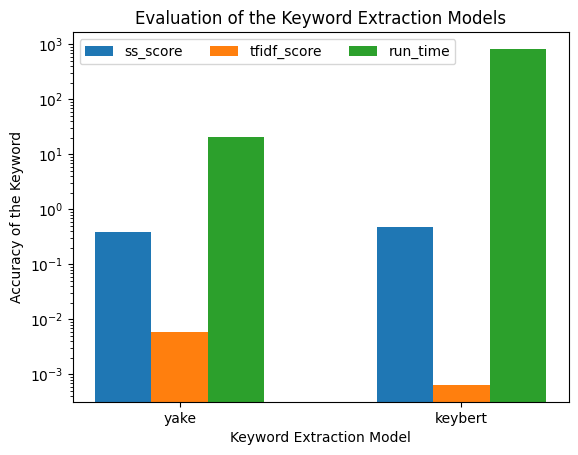

In [ ]:
# Set the positions of the bars on the x-axis
x = np.arange(len(scoring_df))

# Set the width of each bar
width = 0.2

# Create the figure and axes
fig, ax = plt.subplots()

# Plot the bars for each group
for i, col in enumerate(scoring_df.columns):
    rects = ax.bar(x + (i - len(scoring_df.columns)/2 + 0.5) * width, scoring_df[col], width, label=col)

# Add labels, title, legend and x-axis tick to the plot
ax.set_xticks(x)
ax.set_xticklabels(scoring_df.index)
ax.set_ylabel('Accuracy of the Keyword')
ax.set_xlabel('Keyword Extraction Model')
ax.set_title('Evaluation of the Keyword Extraction Models')
ax.legend(loc='upper left', ncols=3)
plt.yscale('log')

# Display the plot
plt.show()